In [2]:
import sys
from pathlib import Path
parent_dir = Path.cwd().parent
sys.path.append(str(parent_dir))
sys.path.append('./../../RoboPoint/')

from robopoint_utils import load_model, get_coordinates, generate_prompt, do_inference_with_logits, calculate_probs_per_coordinate
from utils import extract_all, plot_scatter, calculate_euclidian_distance, calculate_normalized_euclidian_distance, visualize_points_on_image, close_all_images

2025-02-06 14:49:55.897528: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-06 14:49:56.109517: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-06 14:49:56.109564: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-06 14:49:56.109593: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-06 14:49:56.128207: I tensorflow/core/platform/cpu_feature_g

In [3]:
model_name = "wentao-yuan/robopoint-v1-vicuna-v1.5-13b"
model, processor, tokenizer = load_model(model_name)

Loading checkpoint shards:   0%|          | 0/6 [00:00<?, ?it/s]

Some weights of the model checkpoint at wentao-yuan/robopoint-v1-vicuna-v1.5-13b were not used when initializing LlavaLlamaForCausalLM: ['model.vision_tower.vision_tower.vision_model.embeddings.class_embedding', 'model.vision_tower.vision_tower.vision_model.embeddings.patch_embedding.weight', 'model.vision_tower.vision_tower.vision_model.embeddings.position_embedding.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.layer_norm1.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.layer_norm1.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.layer_norm2.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.layer_norm2.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.mlp.fc1.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.mlp.fc1.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.mlp.fc2.bias', 'model.vision_tower.vision_tower.vision_model.encoder

In [7]:
import numpy as np
from scipy.spatial import ConvexHull, distance
import matplotlib.pyplot as plt

def calculate_spread(points, width, height):
    """
    Computes the maximum Euclidean distance between two farthest points in a given list.
    
    :param points: List or numpy array of (x, y) coordinates.
    :return: Maximum Euclidean distance.
    """
    points = np.array(points)
    
    # Compute convex hull
    hull = ConvexHull(points)
    hull_points = points[hull.vertices]

    # Compute pairwise distances only among hull points
    max_dist = 0

    for i in range(len(hull_points)):
        for j in range(i + 1, len(hull_points)):
            max_dist = max(max_dist, calculate_normalized_euclidian_distance(hull_points[i], hull_points[j], width, height))

    return max_dist

def plot_scatter(labels, list_of_probs, list_of_distances, title="Scatterplot", x_label = "Groundtruth distance", y_label = "Probabilities"):
    for label, probs, distances in zip(labels, list_of_probs, list_of_distances):
        plt.scatter(distances, probs, marker='o', label=label)
    
    # Adding labels
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.legend(loc=(1.04, 0))
    
    # Show the plot
    plt.show()
    plt.close()

In [8]:
from PIL import Image
import numpy as np

def run_spread_experiment(prompts, temperatures, runs_per_instance, ignoreCoordinateDecimalPlaces, experiment_path = "../data/first_experiments"):
    tasks, images, ground_truths, object_list = extract_all(experiment_path)

    list_of_mean_distances = []
    list_of_min_distances = []
    list_of_spreads = []
    list_of_probs = []
    labels = []
    for i in range(len(tasks)):
        print(f"Task: {i + 1}")
        print(tasks[i])
    
        image_path = images[i]
        task = tasks[i]
        objects = object_list[i]
        groundtruths = ground_truths[i]
    

        with Image.open(image_path) as image:
            width, height = image.size
            for object, groundtruth in zip(objects, groundtruths):
                distances = []
                probs = []
                coordinates_per_task = []
                image_coordinate_list = []
                image_labels = []

                for prompt_start in prompts:
                    prompt = generate_prompt(object, prompt_start)

                    for temperature in temperatures:
                    
                        for j in range(runs_per_instance):
                            generated_text, outputs = do_inference_with_logits(image, prompt, model, processor, tokenizer, temperature)
                            #print(f"Output: {generated_text}")
                            
                            coordinates = get_coordinates(generated_text, width, height)
                            if len(coordinates) == 0:
                                continue
                                
                            first_prob = calculate_probs_per_coordinate(outputs, ignoreCoordinateDecimalPlaces)[0].item()
                            distance = calculate_normalized_euclidian_distance(coordinates[0], groundtruth, width, height)
                            
                    
                            image_coordinate_list.append(coordinates)
                            image_labels.append(f"{prompt_start}({temperature})")
                    
                            distances.append(distance)
                            coordinates_per_task.append(coordinates[0])
                            probs.append(first_prob)
                        
                            
                visualize_points_on_image(image, image_labels, image_coordinate_list, object)
                label = task + " (" + object + ")"
                labels.append(label)
                list_of_mean_distances.append(np.mean(distances))
                list_of_min_distances.append(np.min(distances))
                list_of_probs.append(np.mean(probs))
                list_of_spreads.append(calculate_spread(coordinates_per_task, width, height))
                
    plot_scatter(labels, list_of_spreads, list_of_mean_distances, "Correlation Spread - Mean Distance", "Mean Distance to Groundtruth", "Spreads")
    plot_scatter(labels, list_of_spreads, list_of_min_distances, "Correlation Spread - Min Distance", "Min Distance to Groundtruth", "Spreads")
    plot_scatter(labels, list_of_probs, list_of_spreads, "Correlation Probability - Spread", "Spreads", "Mean Probabilities")
    plot_scatter(labels, list_of_probs, list_of_mean_distances, "Correlation Prob - Mean Distance", "Mean Distance to Groundtruth", "Mean Probabilities")

Task: 1
pull the oven tray


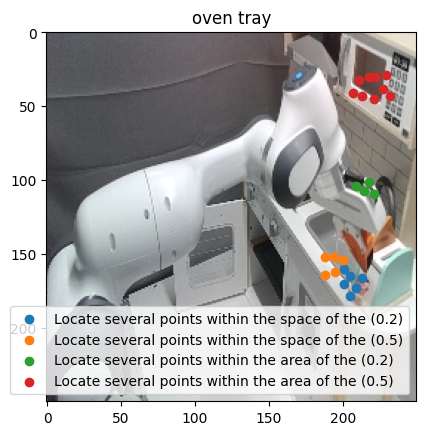

Task: 2
move the fruit from the left stove to the sink


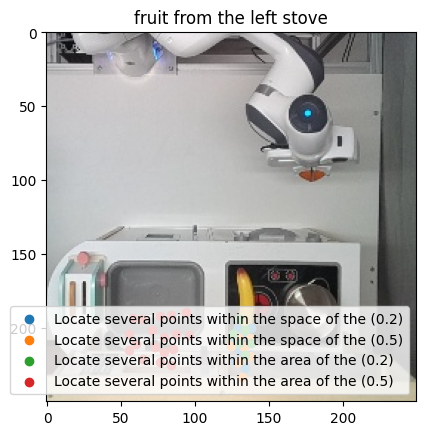

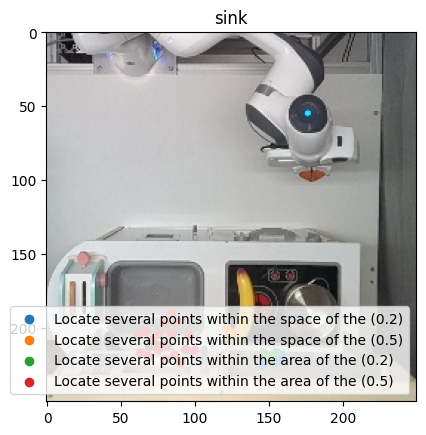

Task: 3
open low fridge


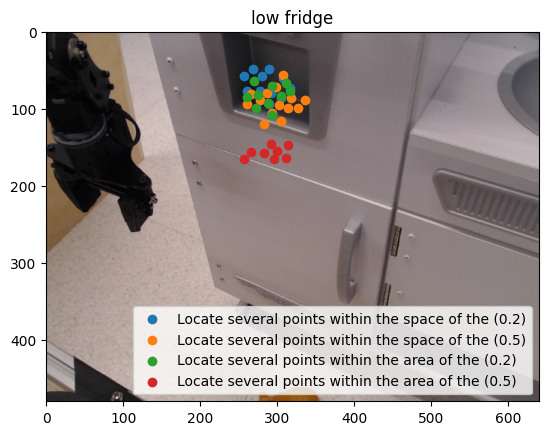

Task: 4
open the drawer


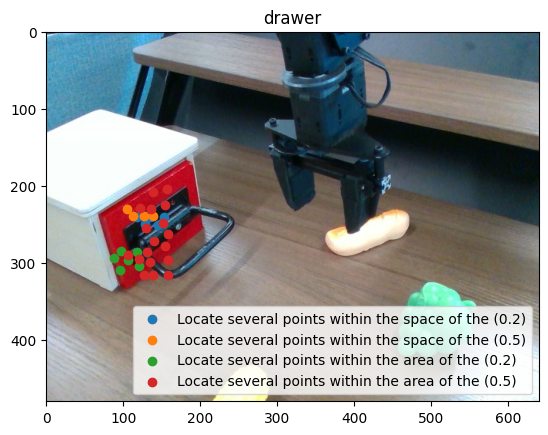

Task: 5
Move the can from the top left of the burner to the bottom left of the burner


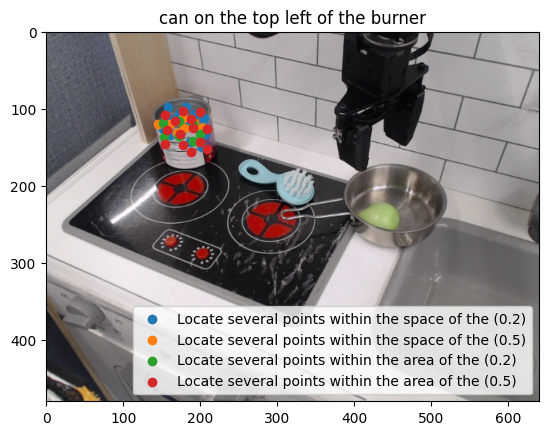

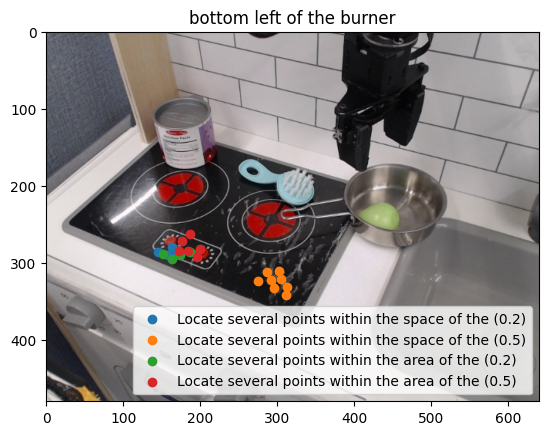

Task: 6
Place the pot to the right of the blue fork.


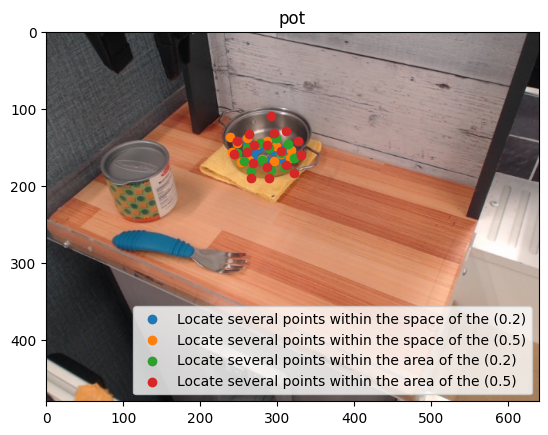

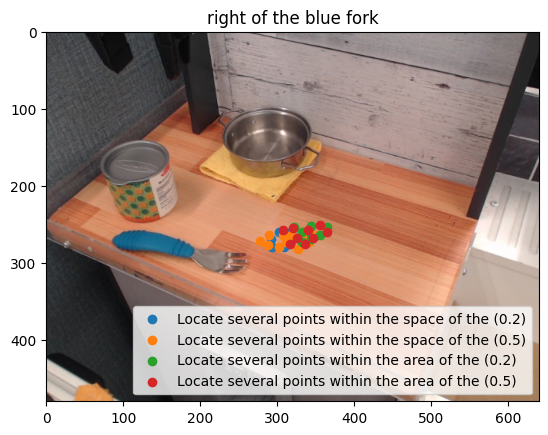

Task: 7
move the pot from the right to the left stove


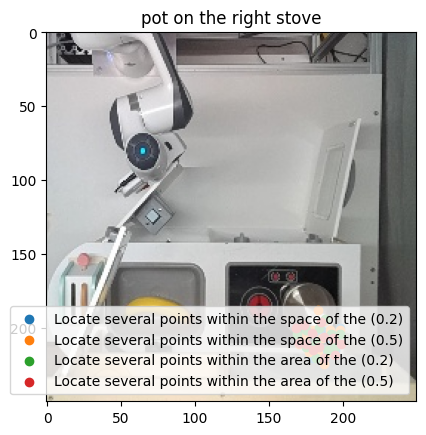

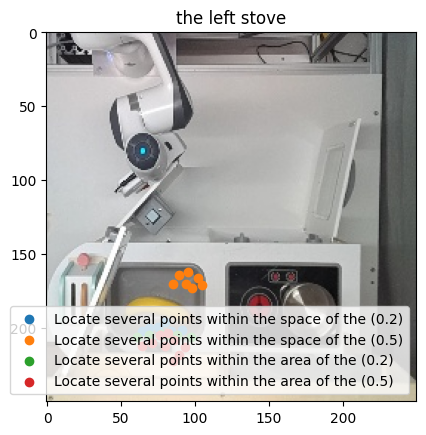

Task: 8
put potato in pot or pan


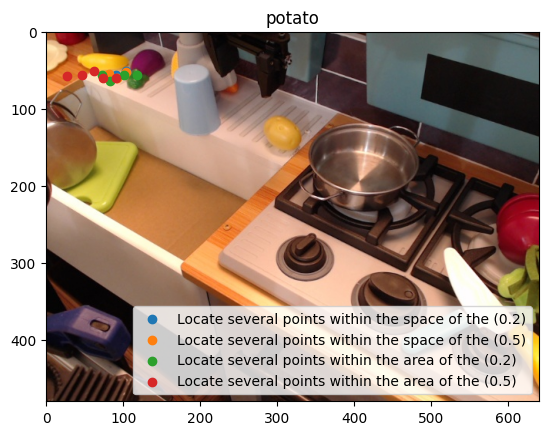

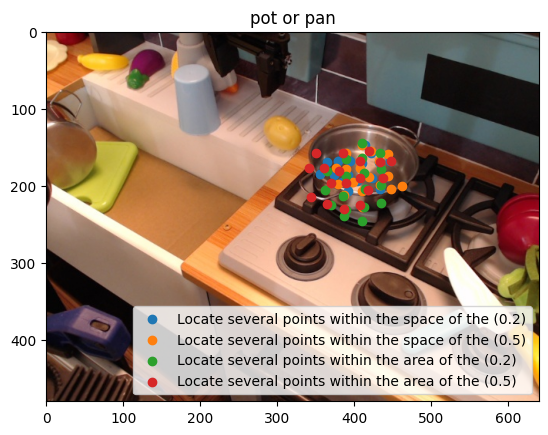

Task: 9
take cucumber out of cup


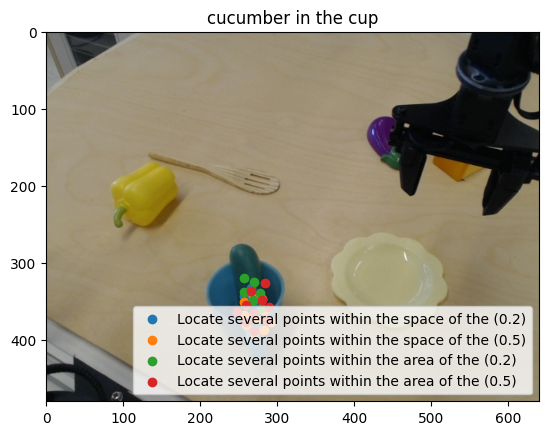

Task: 10
move the banana from the left stove to the sink


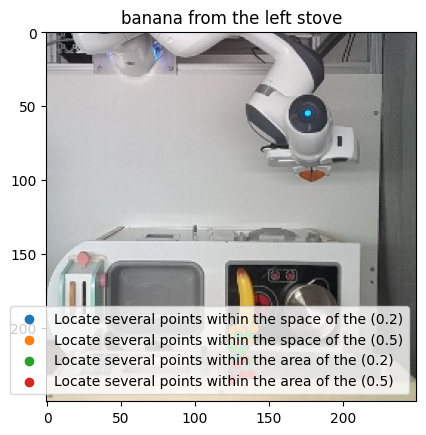

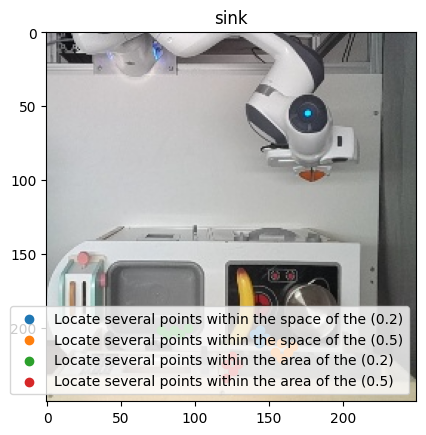

Task: 11
pick up the toast and put it to the sink


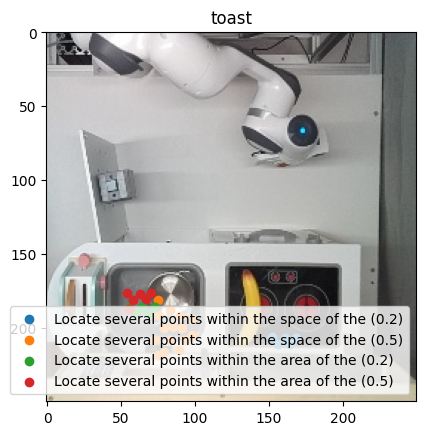

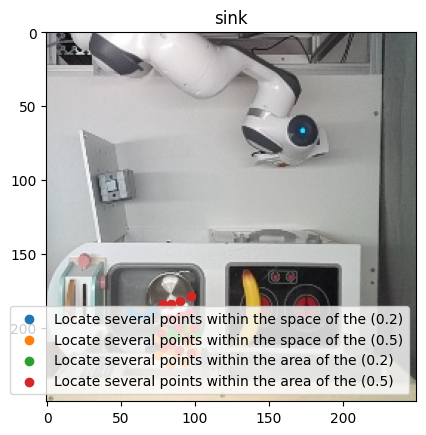

Task: 12
close the microwave


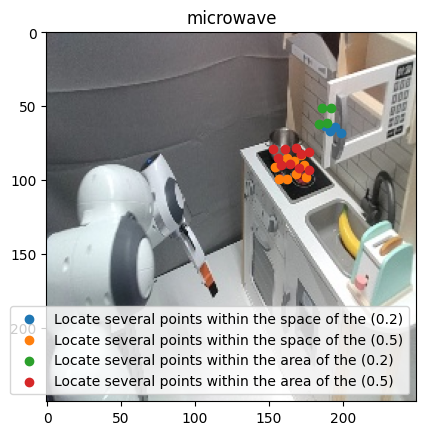

Task: 13
push the toaster lever


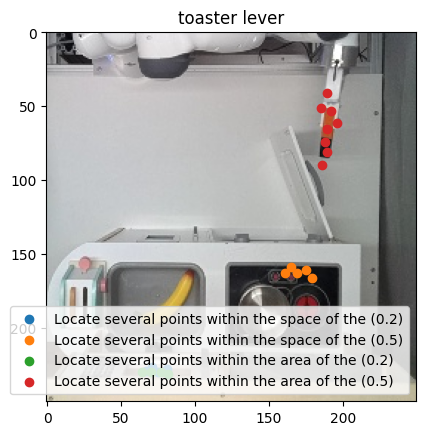

Task: 14
pick up glass cup


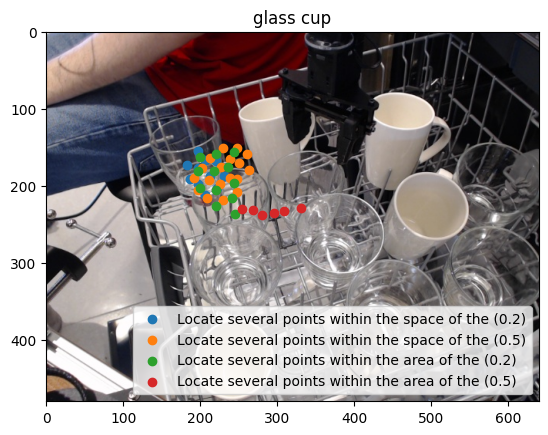

Task: 15
take the broccoli and put it between the two right burners


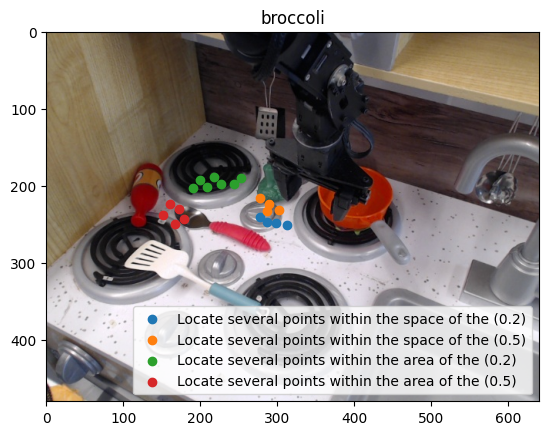

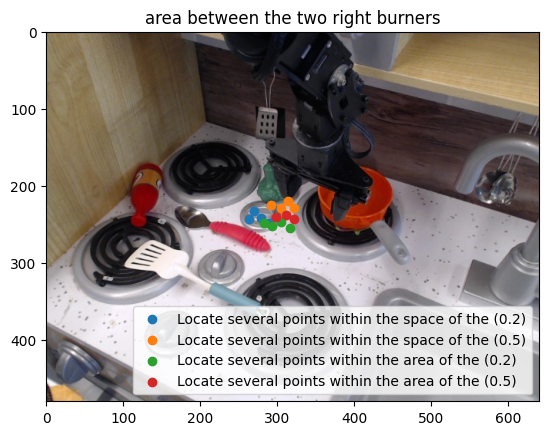

Task: 16
move the pot from the left to the right stove


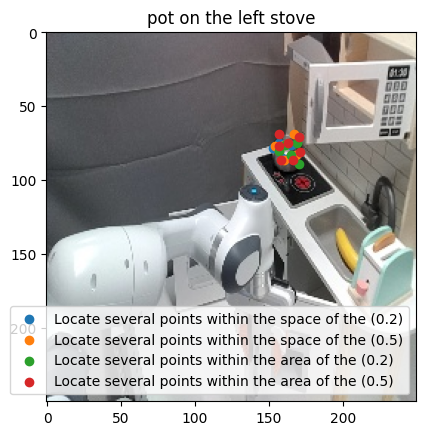

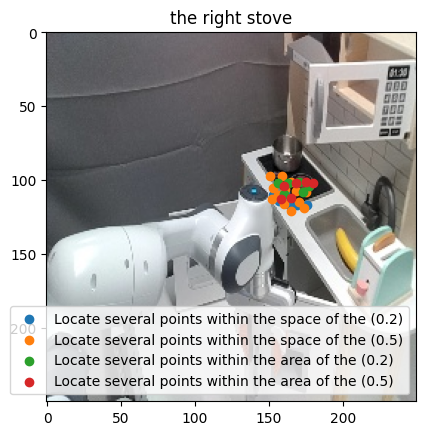

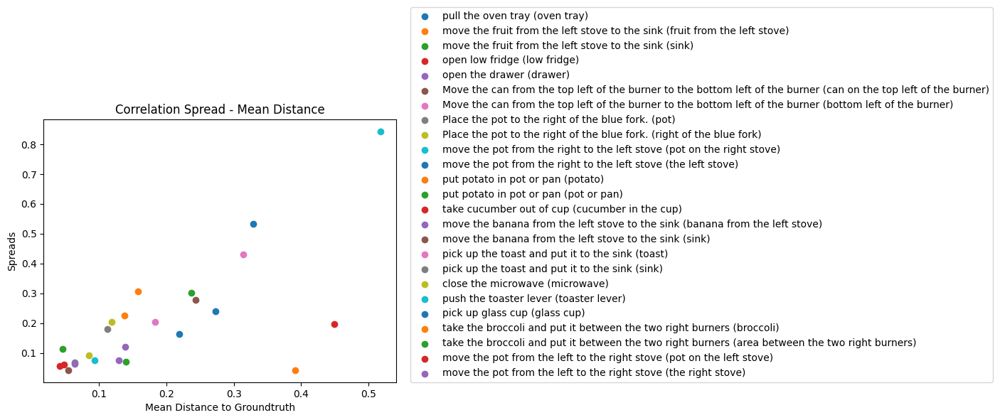

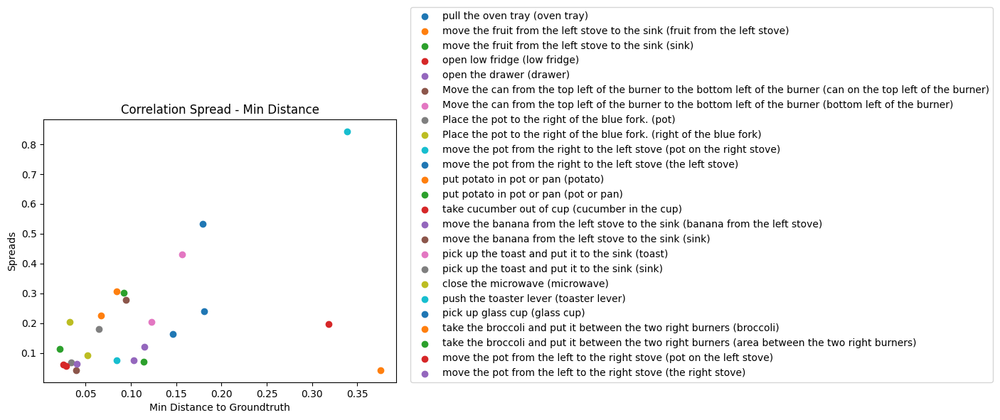

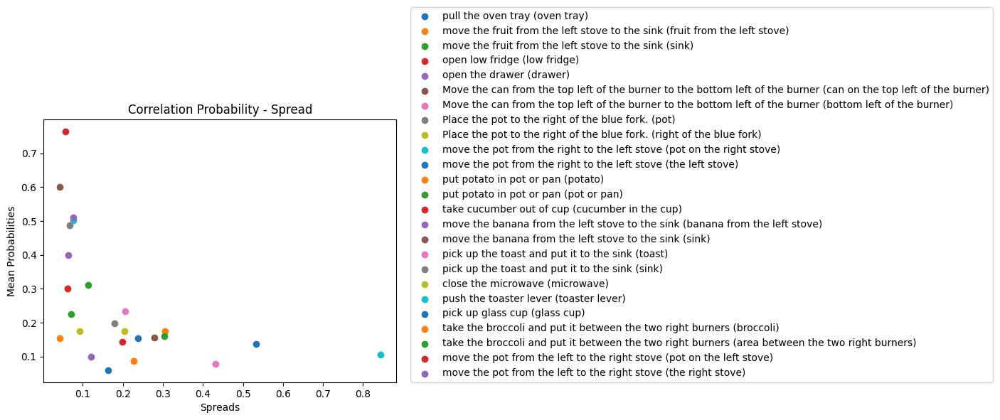

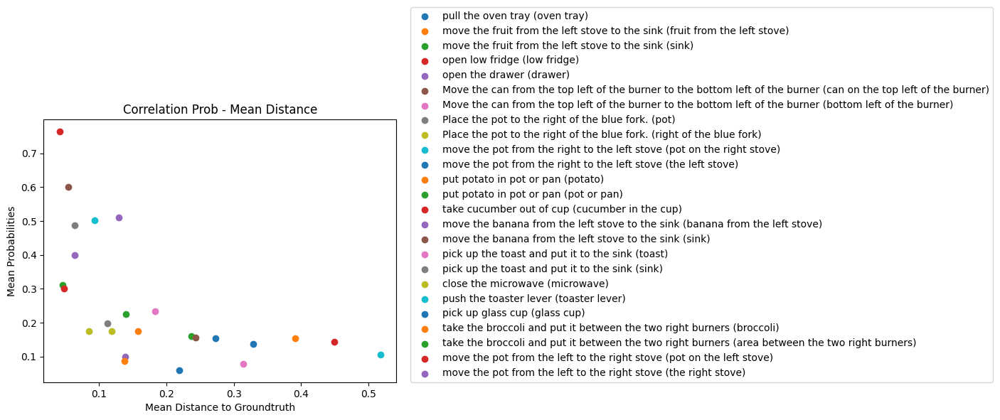

In [11]:
PROMPTS = [
    "Locate several points within the space of the ",
    "Locate several points within the area of the "
]

TEMPERATURES = [
    0.2,
    0.5
    #1
]


run_spread_experiment(
    prompts = PROMPTS,
    temperatures = TEMPERATURES,
    runs_per_instance = 1,
    ignoreCoordinateDecimalPlaces = True,
    experiment_path = "../data/base_experiments"
)

Task: 1
pull the oven tray


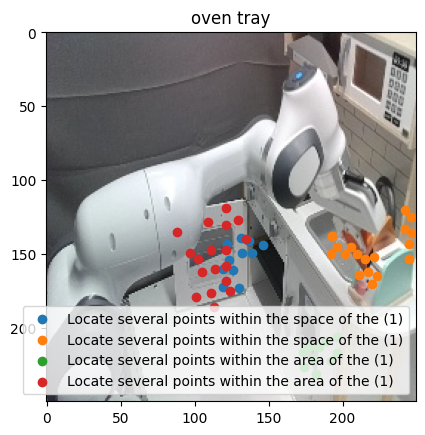

Task: 2
move the fruit from the left stove to the sink


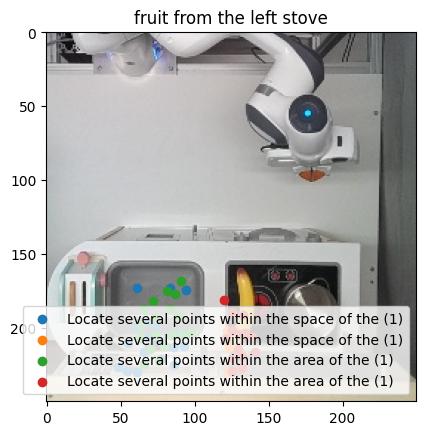

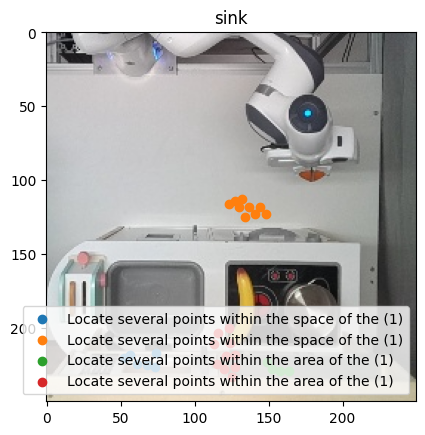

Task: 3
open low fridge


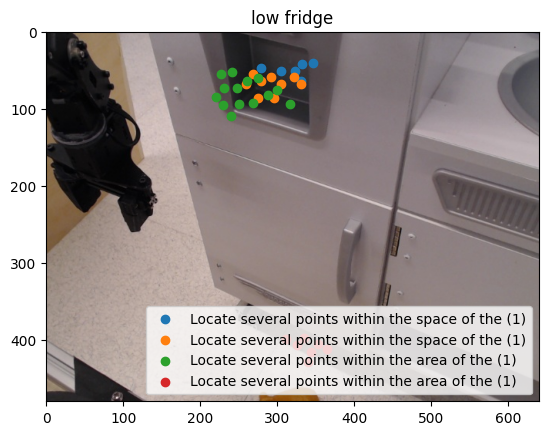

Task: 4
open the drawer


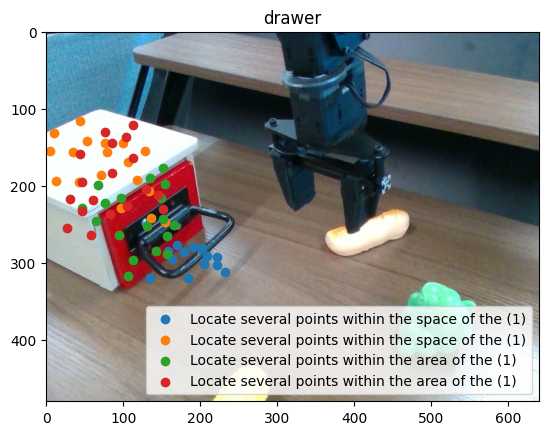

Task: 5
Move the can from the top left of the burner to the bottom left of the burner


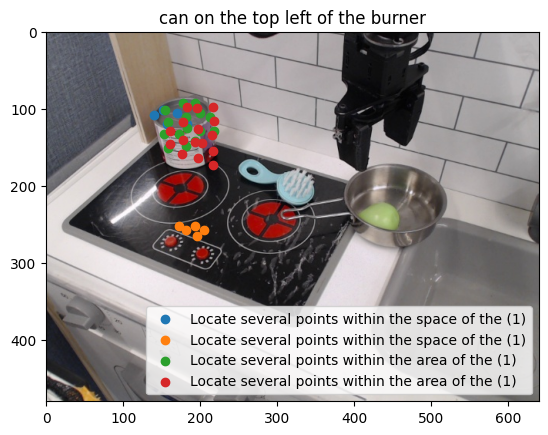

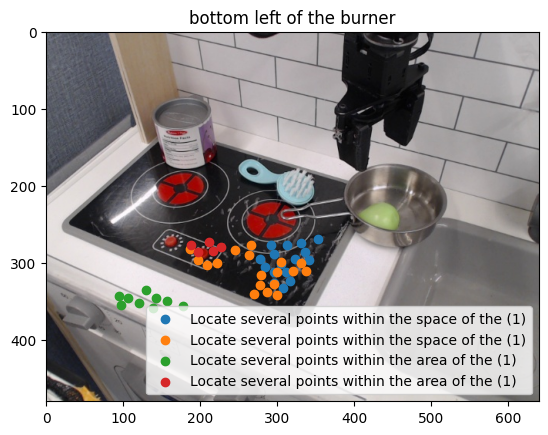

Task: 6
Place the pot to the right of the blue fork.


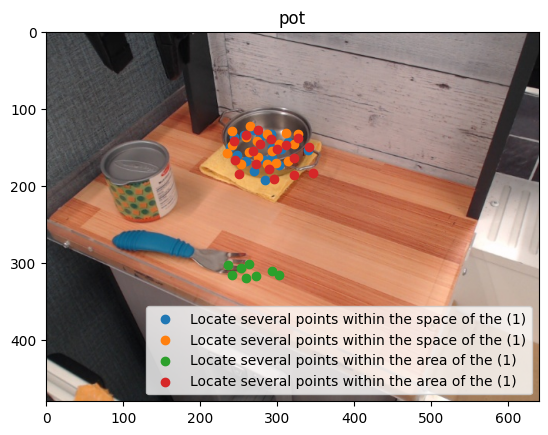

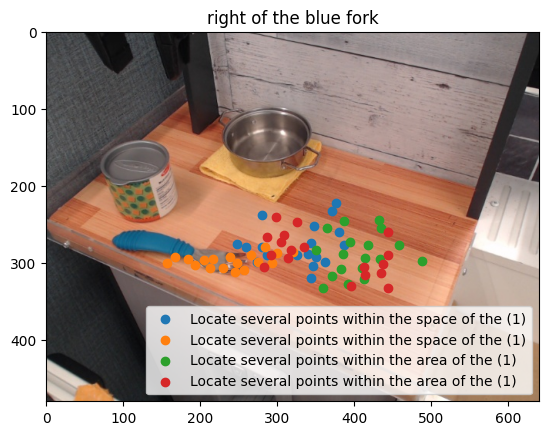

Task: 7
move the pot from the right to the left stove


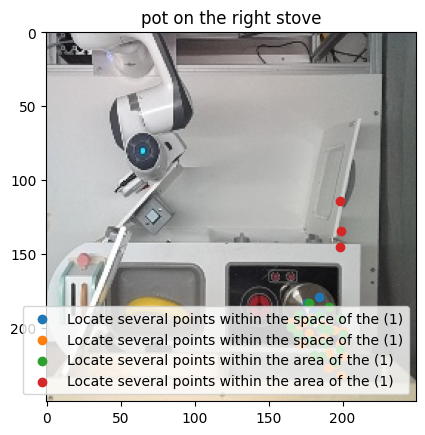

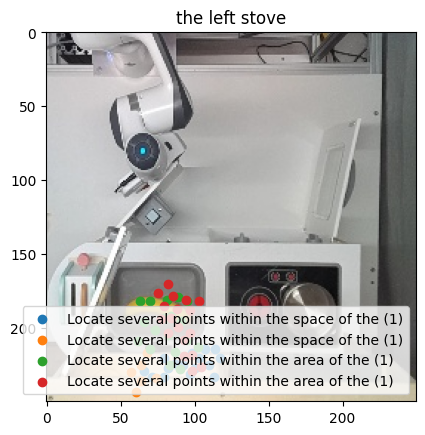

Task: 8
put potato in pot or pan


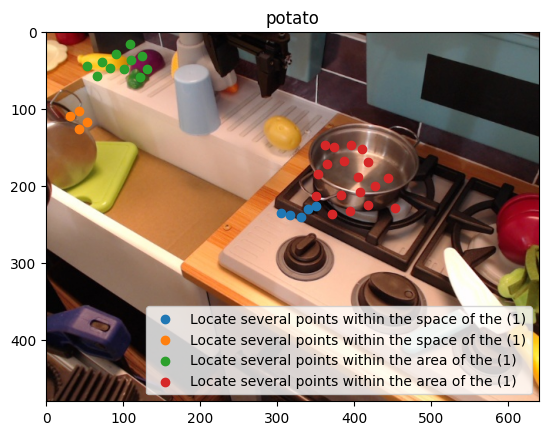

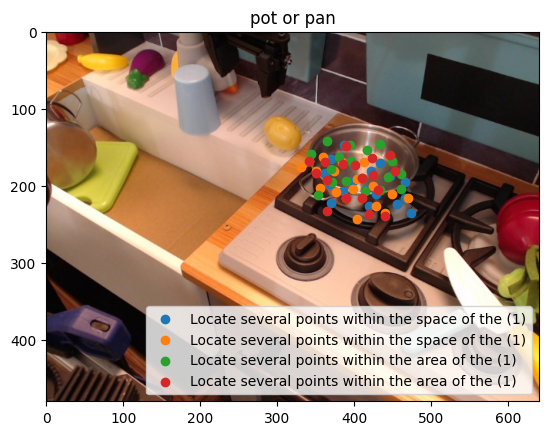

Task: 9
take cucumber out of cup


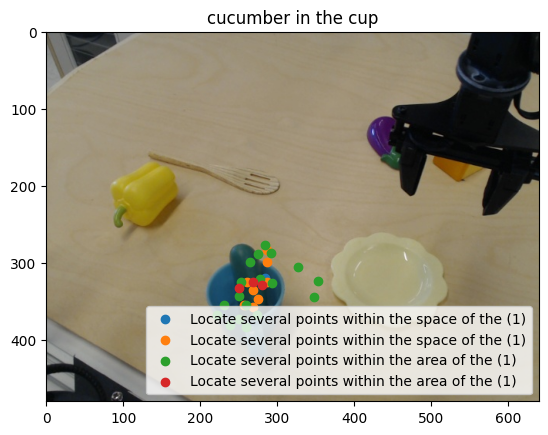

Task: 10
move the banana from the left stove to the sink


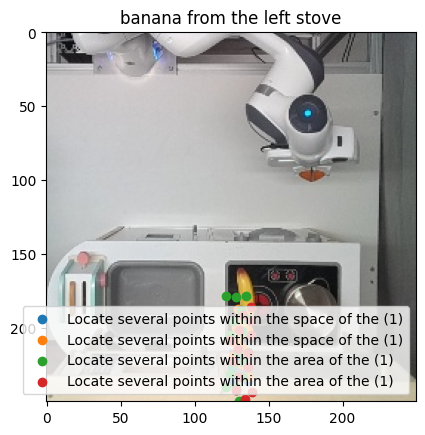

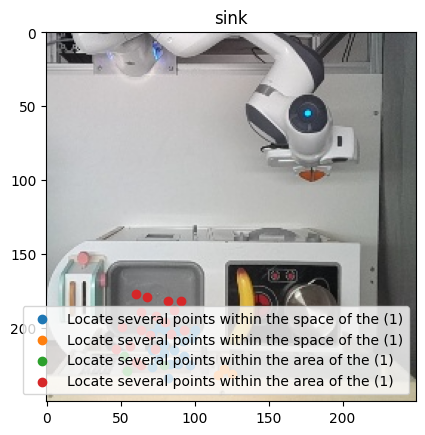

Task: 11
pick up the toast and put it to the sink


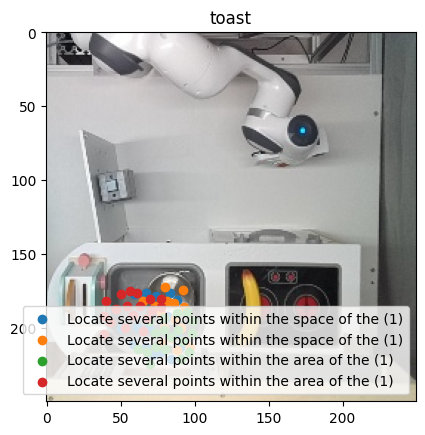

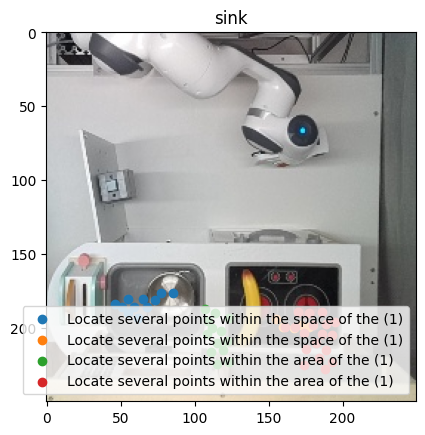

Task: 12
close the microwave


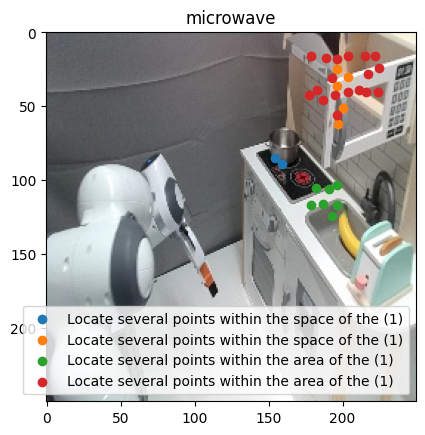

Task: 13
push the toaster lever


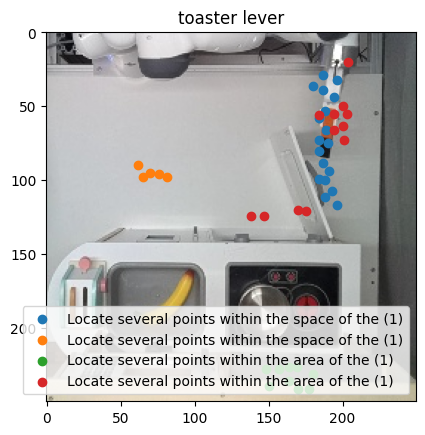

Task: 14
pick up glass cup


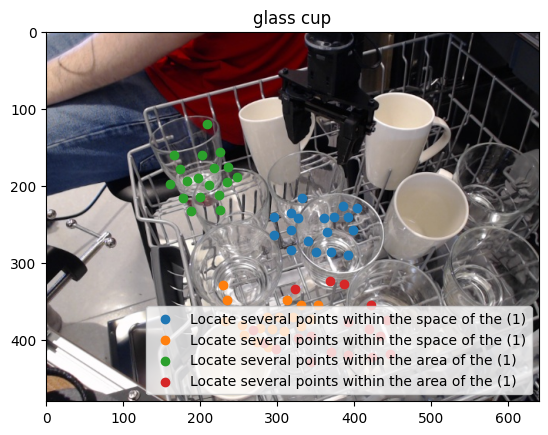

Task: 15
take the broccoli and put it between the two right burners


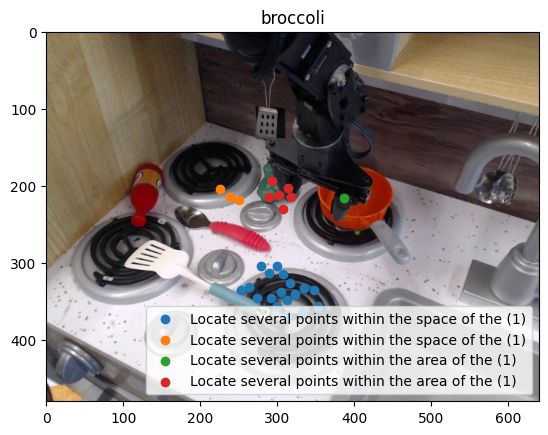

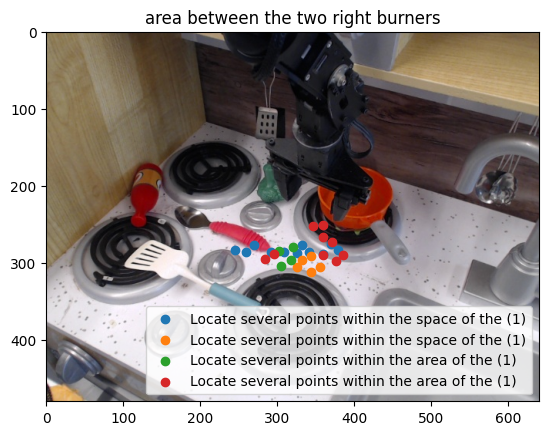

Task: 16
move the pot from the left to the right stove


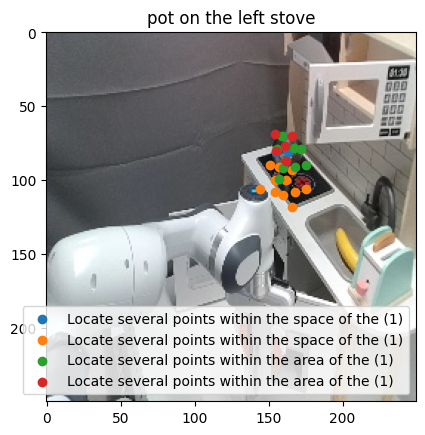

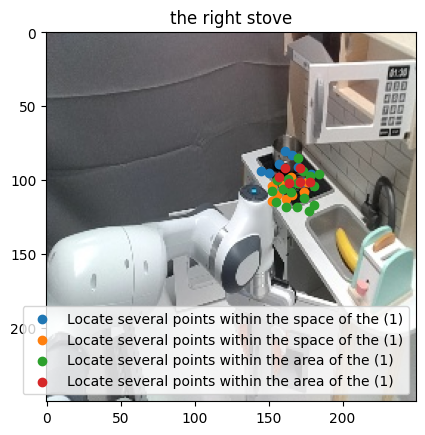

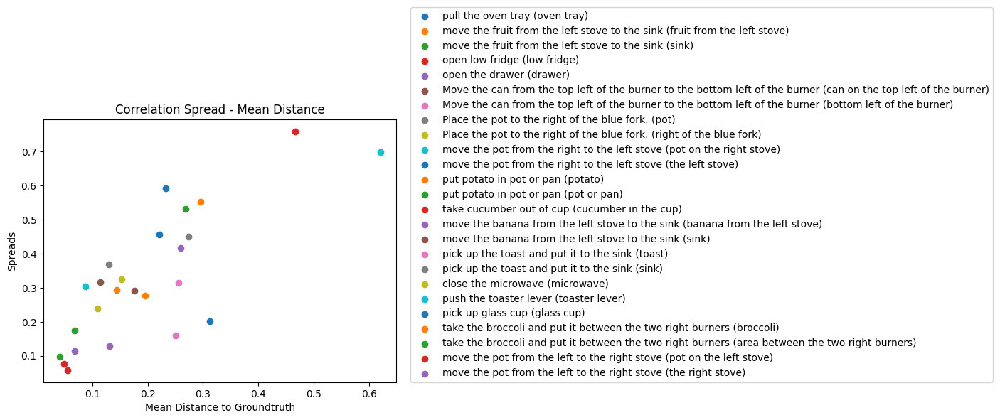

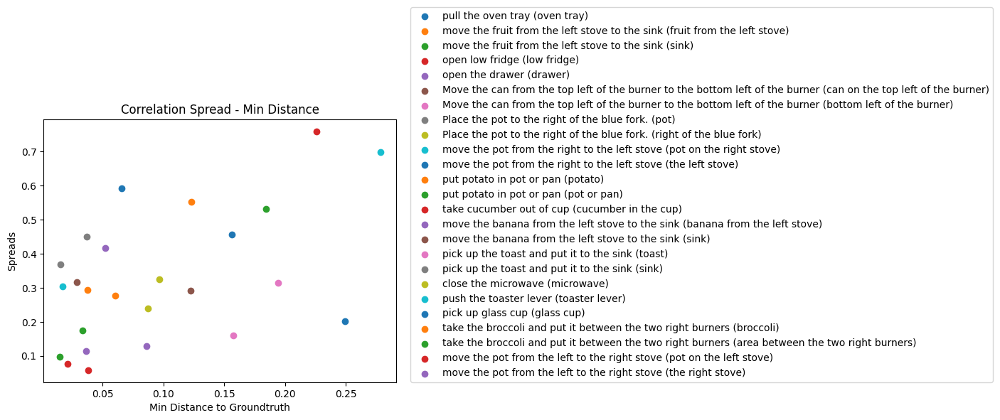

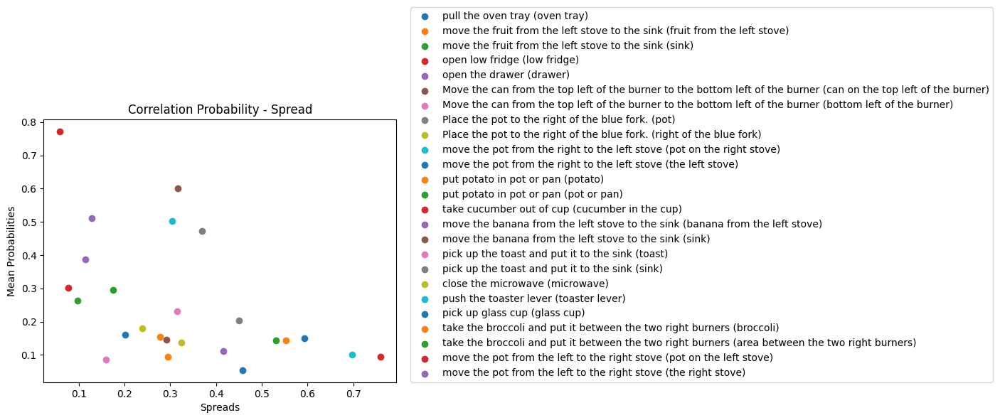

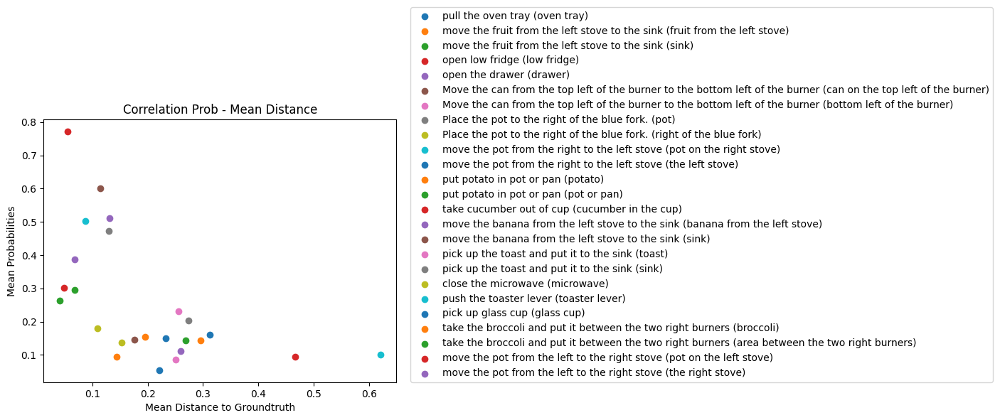

In [12]:
PROMPTS = [
    "Locate several points within the space of the ",
    "Locate several points within the area of the "
]

TEMPERATURES = [
    1
]


run_spread_experiment(
    prompts = PROMPTS,
    temperatures = TEMPERATURES,
    runs_per_instance = 2,
    ignoreCoordinateDecimalPlaces = True,
    experiment_path = "../data/base_experiments"
)

In [ ]:
close_all_images("../data")